# Libraries

In [1]:
import tensorflow as tf
import tensorflow.keras.utils as utils
from tensorflow.keras import datasets
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dense, Activation
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard
from tensorflow.keras.layers import Flatten, BatchNormalization, Dropout, ReLU
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array
# from keras.callbacks import ReduceLROnPlateau
from time import perf_counter
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd
from tensorflow.keras.preprocessing import image
from tensorflow.keras import applications
from tensorflow.keras import layers
import tensorflow_addons as tfa
from tensorflow import keras

import pandas as pd

In [2]:
from typing import Optional
import tensorflow as tf
from typeguard import typechecked

@tf.keras.utils.register_keras_serializable(package="Addons")
class SigmoidAsymmetricLoss(tf.keras.losses.Loss):
    """
    Implements the asymmetric loss function.
    (https://arxiv.org/pdf/2009.14119.pdf).
    This is the first one among the three versions of the loss: 
    AsymmetricLoss, AsymmetricLossOptimized, ASLSingleLabel
    (https://github.com/Alibaba-MIIL/ASL/blob/main/src/loss_functions/losses.py)
    Usage with `tf.keras` API:
    >>> model = tf.keras.Model()
    >>> model.compile(optimizer='sgd', loss=SigmoidAsymmetricLoss())
    """
    @typechecked
    def __init__(
        self,
        from_logits: bool = False,
        gamma_neg: float = 4.0,
        gamma_pos: float = 1.0,
        clip: float = 0.05,
        epsilon: float = 1e-8,
        reduction: str = tf.keras.losses.Reduction.NONE,
        name: Optional[str] = None,
    ):
        super().__init__(name=name, reduction=reduction)
        self.from_logits = from_logits
        self.gamma_neg = gamma_neg
        self.gamma_pos = gamma_pos
        self.clip = clip
        self.epsilon = epsilon or tf.keras.backend.epsilon()

    def call(self, y_true, y_pred):
        # Set Data Types
        y_pred = tf.convert_to_tensor(y_pred)
        y_true = tf.cast(y_true, dtype=y_pred.dtype)

        # Calculating Probabilities
        if self.from_logits:
            y_pred = tf.sigmoid(y_pred)
        xs_pos = y_pred
        xs_neg = 1.0 - y_pred

        # Asymmetric Clipping
        if self.clip is not None and self.clip > 0:
            xs_neg = xs_neg + self.clip
            xs_neg = tf.clip_by_value(xs_neg, clip_value_min=tf.reduce_min(xs_neg), clip_value_max=1.0)

        # Basic CE calculation
        xs_pos = tf.clip_by_value(xs_pos, clip_value_min=self.epsilon, clip_value_max=tf.reduce_max(xs_pos))
        xs_neg = tf.clip_by_value(xs_neg, clip_value_min=self.epsilon, clip_value_max=tf.reduce_max(xs_neg))
        los_pos = y_true * tf.math.log(xs_pos)
        los_neg = (1.0 - y_true) * tf.math.log(xs_neg)
        loss = los_pos + los_neg

        # Asymmetric Focusing
        if self.gamma_neg > 0 or self.gamma_pos > 0:
            pt0 = xs_pos * y_true
            pt1 = xs_neg * (1.0 - y_true) # pt = p if t > 0 else 1-p
            pt = pt0 + pt1
            one_sided_gamma = self.gamma_pos * y_true + self.gamma_neg * (1.0 - y_true)
            one_sided_w = tf.math.pow(1.0 - pt, one_sided_gamma)
            loss *= one_sided_w

        return -tf.math.reduce_sum(loss, axis=-1)

    def get_config(self):
        config = {
            "from_logits": self.from_logits,
            "gamma_neg": self.gamma_neg,
            "gamma_pos": self.gamma_pos,
            "clip": self.clip,
            "epsilon": self.epsilon,
        }
        base_config = super().get_config()
        return {**base_config, **config}

In [3]:
import tensorflow as tf

print(tf.__version__)

2.10.0


# Check GPU device

In [4]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 17226856913527814698
 xla_global_id: -1,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 6243221504
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 10179425805676195345
 physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 2080, pci bus id: 0000:17:00.0, compute capability: 7.5"
 xla_global_id: 416903419,
 name: "/device:GPU:1"
 device_type: "GPU"
 memory_limit: 6242172928
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 12058478744505376814
 physical_device_desc: "device: 1, name: NVIDIA GeForce RTX 2080, pci bus id: 0000:b3:00.0, compute capability: 7.5"
 xla_global_id: 2144165316]

# Data Load

In [5]:
image_directory = 'D:\\Paper\\Data_folder\\'

#Now let us read metadata to get our Y values (multiple lables)
df = pd.read_csv('D:\\Paper\\crack_final.csv',encoding='utf-8')
   
print(df.head())     # printing first five rows of the file
print(df.columns)
print(df.shape)

           ID  101  102  103  104
0  train_img1    1    0    0    0
1  train_img3    1    1    1    0
2  train_img4    1    1    0    0
3  train_img5    0    1    0    0
4  train_img6    1    0    0    0
Index(['ID', '101', '102', '103', '104'], dtype='object')
(26952, 5)


In [6]:
X_dataset= []  

for i in tqdm(range(df.shape[0])):
    img = image.load_img(image_directory +df['ID'][i]+'.jpg', target_size=(224,224,3))
    img = image.img_to_array(img)
    img = img/255.
    X_dataset.append(img)
    
X = np.array(X_dataset)

#Id and Genre are not labels to be trained. So drop them from the dataframe.
#No need to convert to categorical as the dataset is already in the right format.
y = np.array(df.drop(['ID'], axis=1))

100%|████████████████████████████████████████████████████████████████████████████| 26952/26952 [37:45<00:00, 11.90it/s]


# HyperParameters

In [7]:
Batch_size = 8

cos_decay_wr = tf.keras.optimizers.schedules.CosineDecayRestarts(
    initial_learning_rate=0.0001,first_decay_steps=10,
    t_mul=2.0,m_mul=0.9,alpha=0.0,name=None)

SGDWR = tfa.optimizers.SGDW(weight_decay = 0.001,
    learning_rate = cos_decay_wr,momentum = 0.9, nesterov = False)

SGDR = tf.keras.optimizers.SGD(momentum=0.9)

AdamWR = tfa.optimizers.AdamW(
    weight_decay=0.025, beta_1=0.9, beta_2=0.999)

AdamR = tf.keras.optimizers.Adam(beta_1=0.9, beta_2=0.999, epsilon=1e-07)

Epochs = 60

Random_state = 42

tf.keras.losses.BinaryFocalCrossentropy(
    apply_class_balancing=False,
    alpha=0.25,
    gamma=2.0,
    from_logits=True,
    name='binary_focal_crossentropy'
)

# Train test split

In [8]:
X_train, x_test, Y_train, y_test = train_test_split(X, y, random_state = Random_state, test_size = 0.2)

In [9]:
x_train, x_val, y_train, y_val = train_test_split(X_train, Y_train, random_state = Random_state, test_size = 0.125)

# Data Augmentation

In [10]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
        rotation_range=10,
        zoom_range=0.1,
        shear_range=0.1,
        width_shift_range=0.1, 
        height_shift_range=0.1,
        horizontal_flip=True,
        vertical_flip=True,
)

In [11]:
datagen.fit(x_train)
train_datagen = datagen.flow(x_train, y_train, batch_size=Batch_size)

# Modeling

In [12]:
base_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 56, 56, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 56, 56, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 28, 28, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 14, 14, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 14, 14, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 14, 14, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 7, 7, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 7, 7, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 7, 7, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 7, 7, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

In [13]:
for layer in base_model.layers:
    layer.trainable = True

In [14]:
for i, layer in enumerate(base_model.layers):
    print(i, layer.name, layer.trainable)

0 input_1 True
1 conv1_pad True
2 conv1_conv True
3 conv1_bn True
4 conv1_relu True
5 pool1_pad True
6 pool1_pool True
7 conv2_block1_1_conv True
8 conv2_block1_1_bn True
9 conv2_block1_1_relu True
10 conv2_block1_2_conv True
11 conv2_block1_2_bn True
12 conv2_block1_2_relu True
13 conv2_block1_0_conv True
14 conv2_block1_3_conv True
15 conv2_block1_0_bn True
16 conv2_block1_3_bn True
17 conv2_block1_add True
18 conv2_block1_out True
19 conv2_block2_1_conv True
20 conv2_block2_1_bn True
21 conv2_block2_1_relu True
22 conv2_block2_2_conv True
23 conv2_block2_2_bn True
24 conv2_block2_2_relu True
25 conv2_block2_3_conv True
26 conv2_block2_3_bn True
27 conv2_block2_add True
28 conv2_block2_out True
29 conv2_block3_1_conv True
30 conv2_block3_1_bn True
31 conv2_block3_1_relu True
32 conv2_block3_2_conv True
33 conv2_block3_2_bn True
34 conv2_block3_2_relu True
35 conv2_block3_3_conv True
36 conv2_block3_3_bn True
37 conv2_block3_add True
38 conv2_block3_out True
39 conv3_block1_1_conv Tru

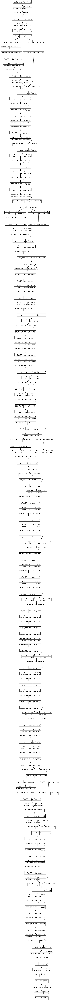

In [15]:
x = base_model.output
x = keras.layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.45)(x)
x = tf.keras.layers.Dense(128)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Dense(128)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
predictions = Dense(4, activation='sigmoid')(x)


model = Model(inputs=base_model.input, outputs = predictions)

from tensorflow.keras.utils import plot_model
%matplotlib inline
plot_model(model, show_shapes=True) 

In [16]:
for i, layer in enumerate(model.layers):
    print(i, layer.name, layer.trainable)

0 input_1 True
1 conv1_pad True
2 conv1_conv True
3 conv1_bn True
4 conv1_relu True
5 pool1_pad True
6 pool1_pool True
7 conv2_block1_1_conv True
8 conv2_block1_1_bn True
9 conv2_block1_1_relu True
10 conv2_block1_2_conv True
11 conv2_block1_2_bn True
12 conv2_block1_2_relu True
13 conv2_block1_0_conv True
14 conv2_block1_3_conv True
15 conv2_block1_0_bn True
16 conv2_block1_3_bn True
17 conv2_block1_add True
18 conv2_block1_out True
19 conv2_block2_1_conv True
20 conv2_block2_1_bn True
21 conv2_block2_1_relu True
22 conv2_block2_2_conv True
23 conv2_block2_2_bn True
24 conv2_block2_2_relu True
25 conv2_block2_3_conv True
26 conv2_block2_3_bn True
27 conv2_block2_add True
28 conv2_block2_out True
29 conv2_block3_1_conv True
30 conv2_block3_1_bn True
31 conv2_block3_1_relu True
32 conv2_block3_2_conv True
33 conv2_block3_2_bn True
34 conv2_block3_2_relu True
35 conv2_block3_3_conv True
36 conv2_block3_3_bn True
37 conv2_block3_add True
38 conv2_block3_out True
39 conv3_block1_1_conv Tru

## Model log file save to h5

In [17]:
from tensorflow.keras.callbacks import ModelCheckpoint
modelcheckpoint = ModelCheckpoint('./weight/ResNet50_final_new_nogen.h5', monitor='val_loss', mode='min', save_best_only=True)
# 파일명 저장 :  모델명_날짜_가중치사용여부.h5

In [18]:
class lrHistory(tf.keras.callbacks.Callback):
    def __init__(self):
        self.lr = []
        
    def on_epoch_begin(self, epoch, logs):
        self.lr.append(tf.keras.backend.get_value(self.model.optimizer.lr))

lrhistory = lrHistory()

In [19]:
lr_scheduler = LearningRateScheduler(cos_decay_wr, verbose=1)

In [20]:
import gc
gc.collect()

50687

In [23]:
with tf.device('/device:GPU:0'):
    model.compile(optimizer=AdamR,loss='binary_crossentropy', metrics=['accuracy'])
    history1 = model.fit(train_datagen, validation_data=(x_val,y_val), epochs=Epochs,callbacks=[modelcheckpoint,lr_scheduler])


Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 1/60
2359/2359 [==============================] - 338s 134ms/step - loss: 0.4358 - accuracy: 0.4615 - val_loss: 0.3513 - val_accuracy: 0.5920 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.75528237177059e-05.
Epoch 2/60
2359/2359 [==============================] - 313s 133ms/step - loss: 0.3841 - accuracy: 0.5138 - val_loss: 0.3669 - val_accuracy: 0.5100 - lr: 9.7553e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.045084152603522e-05.
Epoch 3/60
2359/2359 [==============================] - 312s 132ms/step - loss: 0.3668 - accuracy: 0.5093 - val_loss: 0.4189 - val_accuracy: 0.5007 - lr: 9.0451e-05

Epoch 4: LearningRateScheduler setting learning rate to 7.938926137285307e-05.
Epoch 4/60
2359/2359 [==============================] - 319s 135ms/step - loss: 0.3518 - accuracy: 0.5117 - val_loss: 0.3664 - val_accuracy: 0.5831 - lr: 7.9389e-05

Epoch 5: LearningRat

Epoch 34/60
2359/2359 [==============================] - 320s 135ms/step - loss: 0.2645 - accuracy: 0.5109 - val_loss: 0.3285 - val_accuracy: 0.5345 - lr: 7.9881e-05

Epoch 35: LearningRateScheduler setting learning rate to 7.901778008090332e-05.
Epoch 35/60
2359/2359 [==============================] - 321s 136ms/step - loss: 0.2602 - accuracy: 0.5215 - val_loss: 0.3178 - val_accuracy: 0.5553 - lr: 7.9018e-05

Epoch 36: LearningRateScheduler setting learning rate to 7.791711686877534e-05.
Epoch 36/60
2359/2359 [==============================] - 319s 135ms/step - loss: 0.2583 - accuracy: 0.5190 - val_loss: 0.3074 - val_accuracy: 0.5364 - lr: 7.7917e-05

Epoch 37: LearningRateScheduler setting learning rate to 7.658576214453205e-05.
Epoch 37/60
2359/2359 [==============================] - 320s 135ms/step - loss: 0.2554 - accuracy: 0.5203 - val_loss: 0.3323 - val_accuracy: 0.5304 - lr: 7.6586e-05

Epoch 38: LearningRateScheduler setting learning rate to 7.503191591240466e-05.
Epoch 38/60


In [24]:
gc.collect()

724

##  Loss & Accuracy log save to csv 

In [25]:
pd.DataFrame.from_dict(history1.history).to_csv('./history/ResNet50_final_new_noval.csv',index=False)
# 파일명 :  모델명_날짜_가중치사용여부.csv

# Evaluation

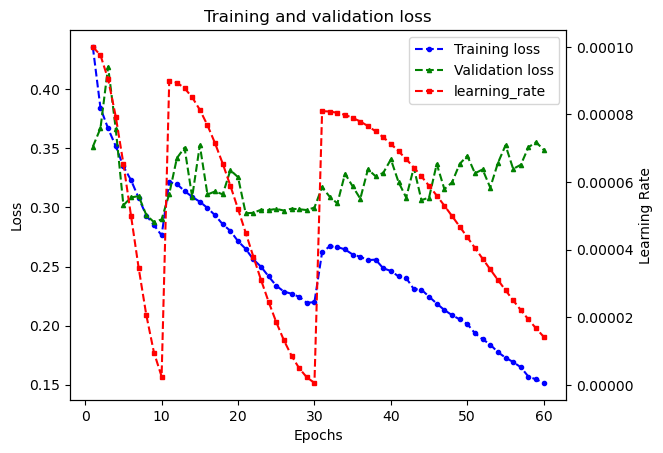

In [26]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
epochs = range(1, Epochs + 1)
loss = history1.history['loss']
val_loss = history1.history['val_loss']
lr = history1.history['lr']

line1 = ax1.plot(epochs, loss, color='b', linestyle='--', marker='o', label = 'Training loss',markersize=3)
line2 = ax1.plot(epochs, val_loss, color='g', linestyle='--', marker='^', label='Validation loss',markersize=3)
line3 = ax2.plot(epochs, lr, color = 'r', linestyle='--', marker='s', label = 'learning_rate',markersize=3)

#plt.plot(epochs, loss, 'y', label='Training loss')
#plt.plot(epochs, val_loss, 'r', label='Validation loss')
#plt.plot(epochs,lr, 'b', label='Learning_rate')
ax1.set_title('Training and validation loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax2.set_ylabel('Learning Rate')

plt.legend(bbox_to_anchor=(1,1))

lines = line1 + line2 + line3
labels = [l.get_label() for l in lines]
plt.legend(lines, labels, loc=1)
plt.show()

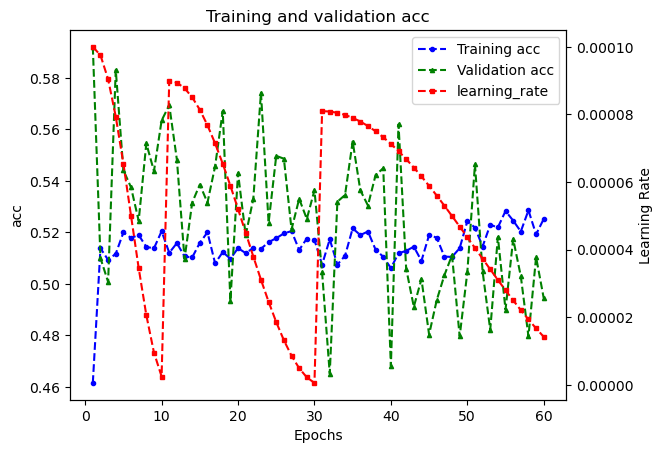

In [27]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
acc = history1.history['accuracy']
val_acc = history1.history['val_accuracy']

line1 = ax1.plot(epochs, acc, color='b', linestyle='--', marker='o', label = 'Training acc', markersize=3)
line2 = ax1.plot(epochs, val_acc, color='g', linestyle='--', marker='^', label='Validation acc', markersize=3)
line3 = ax2.plot(epochs, lr, color = 'r', linestyle='--', marker='s', label = 'learning_rate' , markersize=3)

ax1.set_title('Training and validation acc')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('acc')
ax2.set_ylabel('Learning Rate')
lines = line1 + line2 + line3
labels = [l.get_label() for l in lines]
plt.legend(lines, labels, loc=1)
plt.show()

In [28]:
gc.collect()

5810

# Prediction

In [29]:
y_pred = model.predict(x_test)

169/169 [==============================] - 14s 72ms/step


In [30]:
import gc
gc.collect()

686

In [31]:
print("Actual \n", y_test)
print("\nPredicted \n",y_pred)

Actual 
 [[0 1 0 0]
 [1 1 0 0]
 [1 1 0 0]
 ...
 [0 1 0 1]
 [0 1 0 1]
 [0 1 1 0]]

Predicted 
 [[7.5246042e-01 8.9273447e-01 3.9919633e-03 2.2802026e-04]
 [9.9846315e-01 9.7096956e-01 1.7474623e-03 3.5447403e-05]
 [8.0457366e-01 9.7707522e-01 7.5121120e-06 4.2676306e-04]
 ...
 [9.9383074e-01 9.9997437e-01 1.0703702e-01 9.8975593e-01]
 [2.7446008e-01 9.9553549e-01 7.1036052e-03 7.6304287e-01]
 [5.0509840e-01 9.8822731e-01 9.9241912e-01 2.9085687e-04]]


In [32]:
threshold = 0.5
y_new_pred=[]
for sample in  y_pred:
    y_new_pred.append([1 if i>=0.5 else 0 for i in sample ])
y_new_pred = np.array(y_new_pred)
y_new_pred

array([[1, 1, 0, 0],
       [1, 1, 0, 0],
       [1, 1, 0, 0],
       ...,
       [1, 1, 0, 1],
       [0, 1, 0, 1],
       [1, 1, 1, 0]])

In [33]:
from sklearn.metrics import classification_report

label_names = ['101', '102', '103', '104']

print(classification_report(y_test, y_new_pred,target_names=label_names,digits=3))

              precision    recall  f1-score   support

         101      0.716     0.821     0.765      2430
         102      0.948     0.953     0.950      4832
         103      0.889     0.856     0.872      2564
         104      0.899     0.893     0.896      1959

   micro avg      0.874     0.895     0.884     11785
   macro avg      0.863     0.881     0.871     11785
weighted avg      0.879     0.895     0.886     11785
 samples avg      0.874     0.893     0.863     11785



C:\Users\PIAI\anaconda3\envs\mldl3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\PIAI\anaconda3\envs\mldl3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [34]:
base_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [35]:
for layer in base_model.layers:
    layer.trainable = True

In [36]:
x = base_model.output
x = keras.layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.45)(x)
x = tf.keras.layers.Dense(128)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.Dense(128)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
predictions = Dense(4, activation='sigmoid')(x)


model = Model(inputs=base_model.input, outputs = predictions)

In [37]:
from tensorflow.keras.callbacks import ModelCheckpoint
modelcheckpoint = ModelCheckpoint('./weight/VGG16_final_new_noval.h5', monitor='val_loss', mode='min', save_best_only=True)
# 파일명 저장 :  모델명_날짜_가중치사용여부.h5

In [38]:
class lrHistory(tf.keras.callbacks.Callback):
    def __init__(self):
        self.lr = []
        
    def on_epoch_begin(self, epoch, logs):
        self.lr.append(tf.keras.backend.get_value(self.model.optimizer.lr))

lrhistory = lrHistory()

In [39]:
lr_scheduler = LearningRateScheduler(cos_decay_wr, verbose=1)

In [40]:
import gc
gc.collect()

903

In [41]:
with tf.device('/device:GPU:1'):
    model.compile(optimizer=AdamR,loss='binary_crossentropy', metrics=['accuracy'])
    history1 = model.fit(train_datagen, validation_data=(x_val, y_val),epochs=Epochs,callbacks=[modelcheckpoint,lr_scheduler])


Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 1/60
2359/2359 [==============================] - 326s 135ms/step - loss: 0.5554 - accuracy: 0.4982 - val_loss: 0.5573 - val_accuracy: 0.4952 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.75528237177059e-05.
Epoch 2/60
2359/2359 [==============================] - 312s 132ms/step - loss: 0.5093 - accuracy: 0.5177 - val_loss: 0.5629 - val_accuracy: 0.6091 - lr: 9.7553e-05

Epoch 3: LearningRateScheduler setting learning rate to 9.045084152603522e-05.
Epoch 3/60
2359/2359 [==============================] - 315s 134ms/step - loss: 0.4653 - accuracy: 0.5162 - val_loss: 0.4683 - val_accuracy: 0.5579 - lr: 9.0451e-05

Epoch 4: LearningRateScheduler setting learning rate to 7.938926137285307e-05.
Epoch 4/60
2359/2359 [==============================] - 315s 134ms/step - loss: 0.4441 - accuracy: 0.4918 - val_loss: 0.4602 - val_accuracy: 0.5249 - lr: 7.9389e-05

Epoch 5: LearningRat

Epoch 34/60
2359/2359 [==============================] - 313s 133ms/step - loss: 0.3284 - accuracy: 0.4981 - val_loss: 0.3208 - val_accuracy: 0.5345 - lr: 7.9881e-05

Epoch 35: LearningRateScheduler setting learning rate to 7.901778008090332e-05.
Epoch 35/60
2359/2359 [==============================] - 313s 133ms/step - loss: 0.3219 - accuracy: 0.5028 - val_loss: 0.3180 - val_accuracy: 0.5282 - lr: 7.9018e-05

Epoch 36: LearningRateScheduler setting learning rate to 7.791711686877534e-05.
Epoch 36/60
2359/2359 [==============================] - 314s 133ms/step - loss: 0.3195 - accuracy: 0.4992 - val_loss: 0.3266 - val_accuracy: 0.5516 - lr: 7.7917e-05

Epoch 37: LearningRateScheduler setting learning rate to 7.658576214453205e-05.
Epoch 37/60
2359/2359 [==============================] - 315s 134ms/step - loss: 0.3171 - accuracy: 0.5009 - val_loss: 0.3105 - val_accuracy: 0.5208 - lr: 7.6586e-05

Epoch 38: LearningRateScheduler setting learning rate to 7.503191591240466e-05.
Epoch 38/60


In [42]:
gc.collect()

724

In [43]:
pd.DataFrame.from_dict(history1.history).to_csv('./history/vgg16_final_new_noval.csv',index=False)
# 파일명 :  모델명_날짜_가중치사용여부.csv

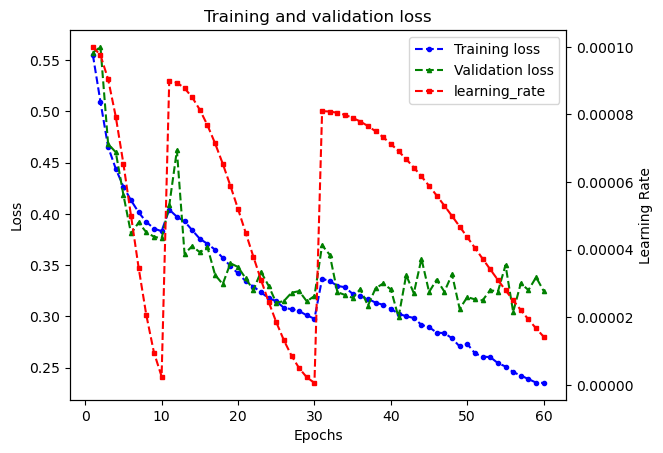

In [44]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
epochs = range(1, Epochs + 1)
loss = history1.history['loss']
val_loss = history1.history['val_loss']
lr = history1.history['lr']

line1 = ax1.plot(epochs, loss, color='b', linestyle='--', marker='o', label = 'Training loss',markersize=3)
line2 = ax1.plot(epochs, val_loss, color='g', linestyle='--', marker='^', label='Validation loss',markersize=3)
line3 = ax2.plot(epochs, lr, color = 'r', linestyle='--', marker='s', label = 'learning_rate',markersize=3)

#plt.plot(epochs, loss, 'y', label='Training loss')
#plt.plot(epochs, val_loss, 'r', label='Validation loss')
#plt.plot(epochs,lr, 'b', label='Learning_rate')
ax1.set_title('Training and validation loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax2.set_ylabel('Learning Rate')

plt.legend(bbox_to_anchor=(1,1))

lines = line1 + line2 + line3
labels = [l.get_label() for l in lines]
plt.legend(lines, labels, loc=1)
plt.show()

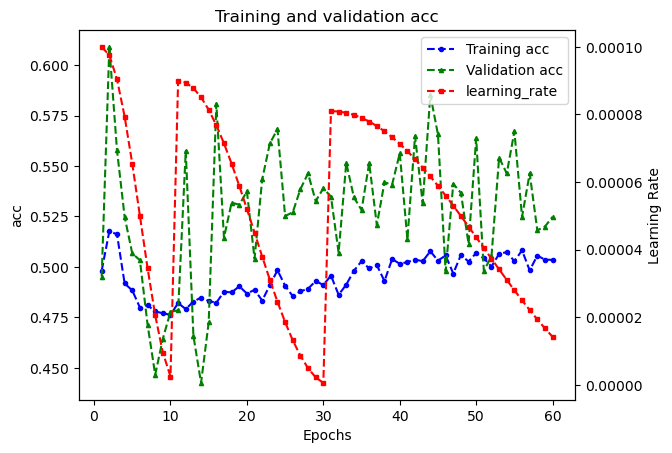

In [45]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
acc = history1.history['accuracy']
val_acc = history1.history['val_accuracy']

line1 = ax1.plot(epochs, acc, color='b', linestyle='--', marker='o', label = 'Training acc', markersize=3)
line2 = ax1.plot(epochs, val_acc, color='g', linestyle='--', marker='^', label='Validation acc', markersize=3)
line3 = ax2.plot(epochs, lr, color = 'r', linestyle='--', marker='s', label = 'learning_rate' , markersize=3)

ax1.set_title('Training and validation acc')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('acc')
ax2.set_ylabel('Learning Rate')
lines = line1 + line2 + line3
labels = [l.get_label() for l in lines]
plt.legend(lines, labels, loc=1)
plt.show()

In [46]:
gc.collect()

11751

In [47]:
y_pred = model.predict(x_test)

169/169 [==============================] - 16s 80ms/step


In [48]:
print("Actual \n", y_test)
print("\nPredicted \n",y_pred)

Actual 
 [[0 1 0 0]
 [1 1 0 0]
 [1 1 0 0]
 ...
 [0 1 0 1]
 [0 1 0 1]
 [0 1 1 0]]

Predicted 
 [[0.9573879  0.8972985  0.06085547 0.00105296]
 [0.7219682  0.95596725 0.12266313 0.00203711]
 [0.964299   0.87064344 0.00752401 0.0027816 ]
 ...
 [0.8795105  0.9757548  0.30089012 0.283853  ]
 [0.86960894 0.97244227 0.00315275 0.83046293]
 [0.78592426 0.9690159  0.9839721  0.00137004]]


In [49]:
threshold = 0.5
y_new_pred=[]
for sample in  y_pred:
    y_new_pred.append([1 if i>=0.5 else 0 for i in sample ])
y_new_pred = np.array(y_new_pred)
y_new_pred

array([[1, 1, 0, 0],
       [1, 1, 0, 0],
       [1, 1, 0, 0],
       ...,
       [1, 1, 0, 0],
       [1, 1, 0, 1],
       [1, 1, 1, 0]])

In [50]:
from sklearn.metrics import classification_report

label_names = ['101', '102', '103', '104']

print(classification_report(y_test, y_new_pred,target_names=label_names,digits=3))

              precision    recall  f1-score   support

         101      0.670     0.866     0.755      2430
         102      0.942     0.954     0.948      4832
         103      0.870     0.871     0.870      2564
         104      0.865     0.904     0.884      1959

   micro avg      0.847     0.910     0.877     11785
   macro avg      0.837     0.899     0.864     11785
weighted avg      0.857     0.910     0.881     11785
 samples avg      0.852     0.908     0.859     11785



C:\Users\PIAI\anaconda3\envs\mldl3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\PIAI\anaconda3\envs\mldl3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [172]:
with tf.GradientTape() as tape:
    last_conv_layer_output, preds = grad_model(img_array)
    loss = K.sum(last_conv_layer_output)
    print(loss)

    grads = tape.gradient(loss, grad_model.input)


tf.Tensor(77921390.0, shape=(), dtype=float32)


AttributeError: 'KerasTensor' object has no attribute '_id'

In [177]:
import keras.backend as K

def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size "size"
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
#     display(Image(cam_path))
    
    return cam_path
    
preprocess_input = tf.keras.applications.resnet50.preprocess_input
#decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

last_conv_layer_name = "conv5_block3_out"
img_size = (224,224)

# Remove last layer's softmax
model.layers[-1].activation = None

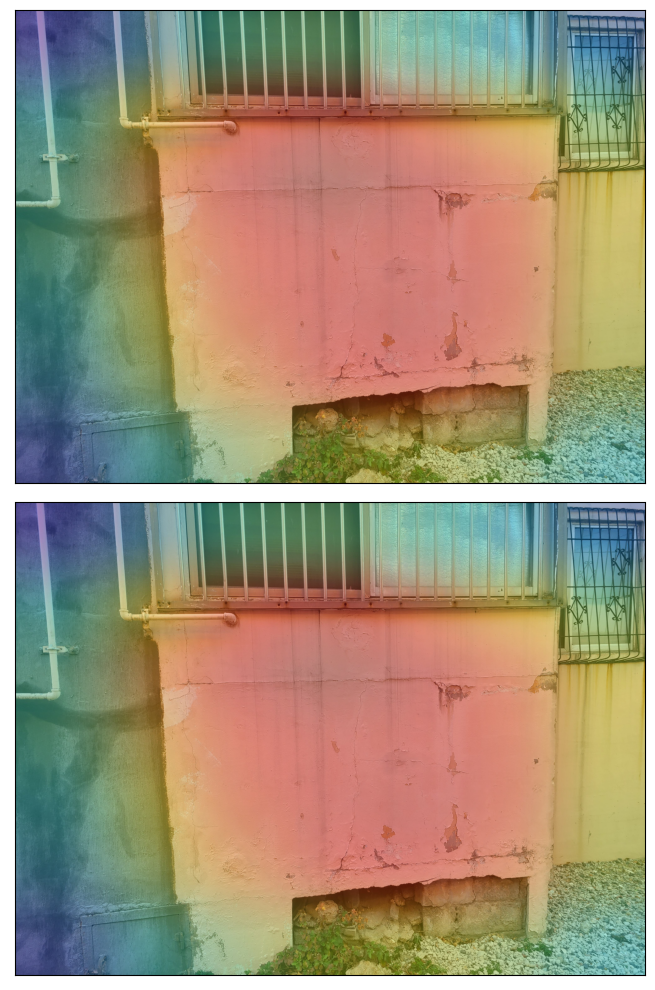

In [181]:
# Display the part of the pictures used by the neural network to classify the pictures
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    img_path = 'D:\\test_data\\POC_78.jpg'
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name,2)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    ax.imshow(plt.imread(cam_path))
    #ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

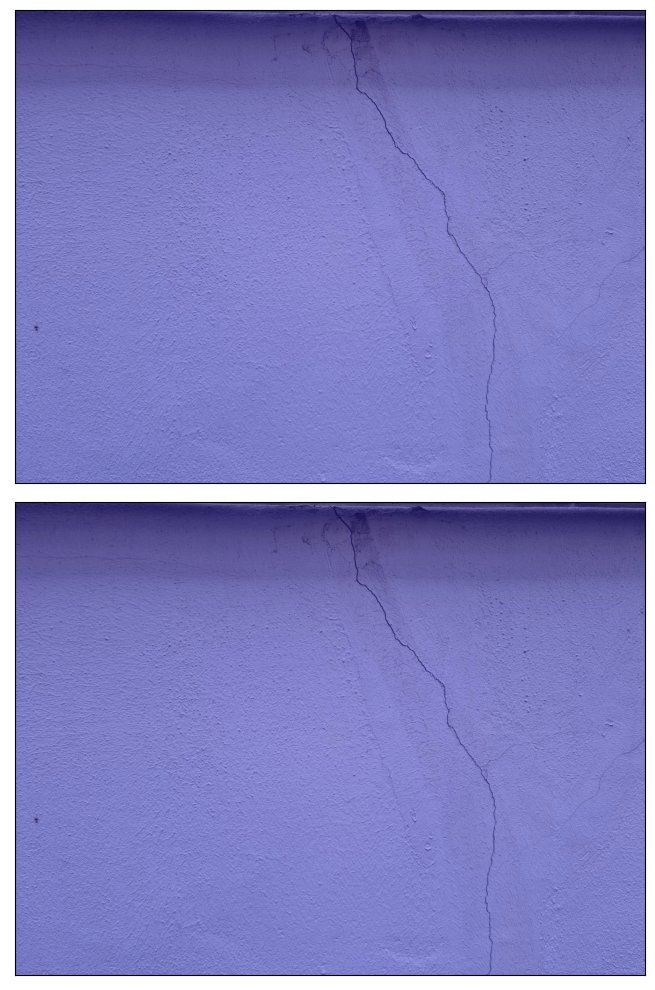

In [185]:
# Display the part of the pictures used by the neural network to classify the pictures
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    img_path = 'D:\\test_data\\POC_22.jpg'
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name,1)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    ax.imshow(plt.imread(cam_path))
    #ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

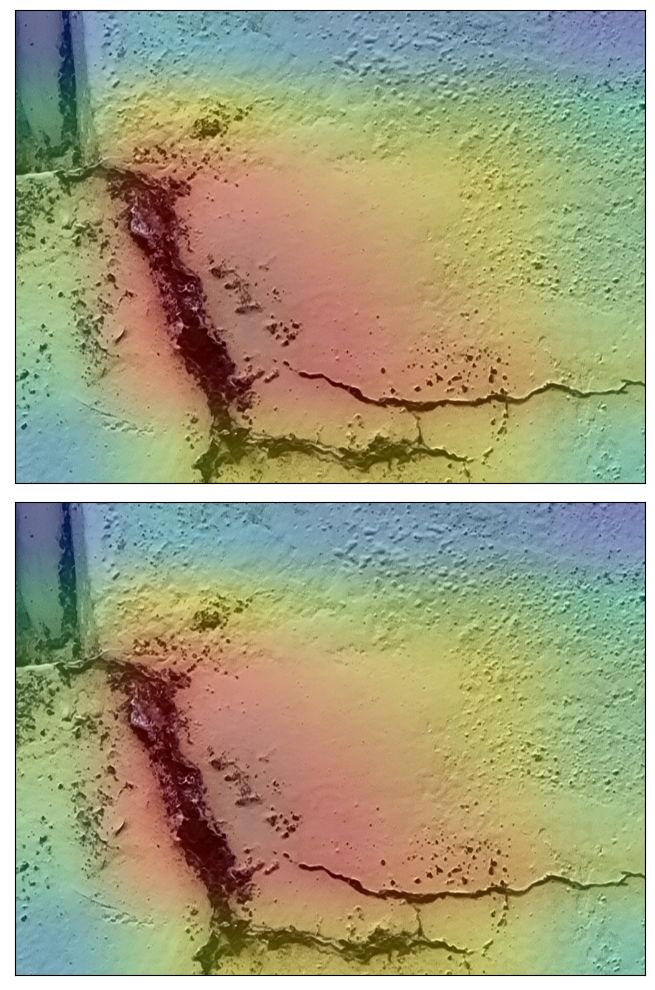

In [139]:
# Display the part of the pictures used by the neural network to classify the pictures
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    img_path = 'D:\\test_data\\POC_27.jpg'
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name,2)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    ax.imshow(plt.imread(cam_path))
    #ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

In [142]:
img = image.load_img('D:\\test_data\\POC_27.jpg', target_size=(224,224,3))
img = image.img_to_array(img)
img = img/255.
pred = model.predict(img)

AttributeError: 'numpy.ndarray' object has no attribute 'load_img'

In [110]:
def generate_grad_cam(model, img_path, class_idx):

    ## img_path -> preprocessed image tensor
    img_arr, img_tensor = preprocess_input(img_path)

    ## get the derivative of y^c w.r.t A^k
    y_c = model.layers[-1].output.op.inputs[0][0, class_idx]
#     y_c = model.output[0, class_idx]
    
#     layer_output = model.get_layer('block5_conv3').output
    layer_output = model.layers[-4].output
    
    grads = K.gradients(y_c, layer_output)[0]
    gradient_fn = K.function([model.input], [layer_output, grads, model.layers[-1].output])
    
    conv_output, grad_val, predictions = gradient_fn([img_tensor])
    conv_output, grad_val = conv_output[0], grad_val[0]
    
    weights = np.mean(grad_val, axis=(0, 1))
    cam = np.dot(conv_output, weights)
    
    cam = cv2.resize(cam, (224, 224))
    
    ## Relu
    cam = np.maximum(cam, 0)
    
    cam = cam / cam.max()
    
    return img_arr, cam, predictions

In [55]:
!pip install lime

import lime
from lime import lime_image
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt
import random

     -------------------------------------- 275.7/275.7 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283839 sha256=722c13e7e34c23537d94b453981e40ade40b58f05281fc45ce88ce6d298f481a
  Stored in directory: c:\users\piai\appdata\local\pip\cache\wheels\ef\f5\11\572c4d43760b43708e7ddb4b401a01742dcb4299a0aa385023
Successfully built lime


# Show Wrong Image 

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


ValueError: cannot resize an array that references or is referenced
by another array in this way.
Use the np.resize function or refcheck=False

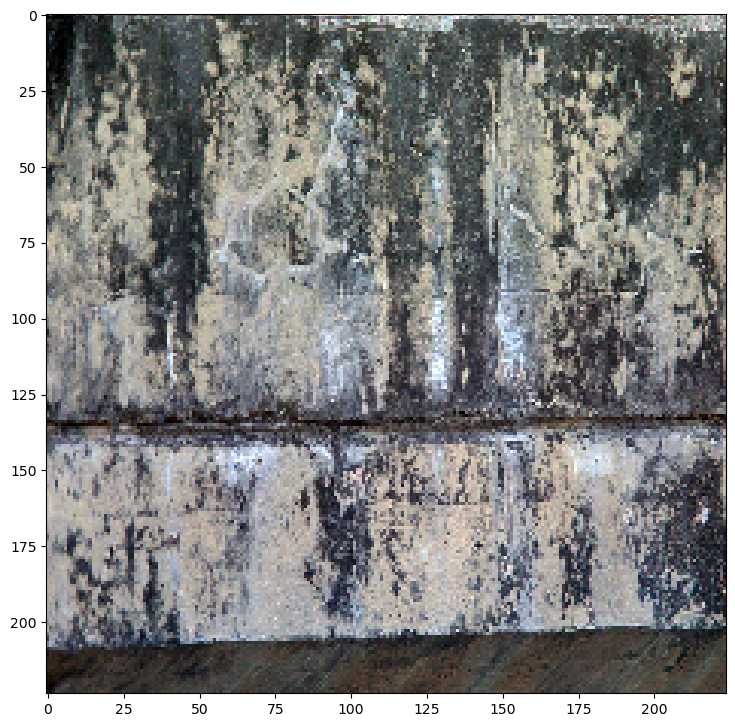

In [69]:
c = 150
for i in range(6):
    plt.figure(figsize=(20,30))
    plt.subplot(3,2, i+1)
    explainer = lime_image.LimeImageExplainer(random_state=42)
    explanation = explainer.explain_instance(
         x_test[c], 
         model.predict
    )
    plt.imshow(x_test[c])
    image, mask = explanation.get_image_and_mask(
         model.predict(
              x_test[c].reshape((1,224,224,3))
         ).argmax(axis=1)[0],
         positive_only=True, 
         hide_rest=False)ㅠ
    plt.imshow(mark_boundaries(image, mask))
    #plt.figure(figsize=(20,30))
    #plt.subplot(3,2, i+1)
    #plt.imshow(x_test[c])
    plt.title("Predicted Class {},Actual Class {}".format(y_new_pred[c], y_test[c]))
    c += 1

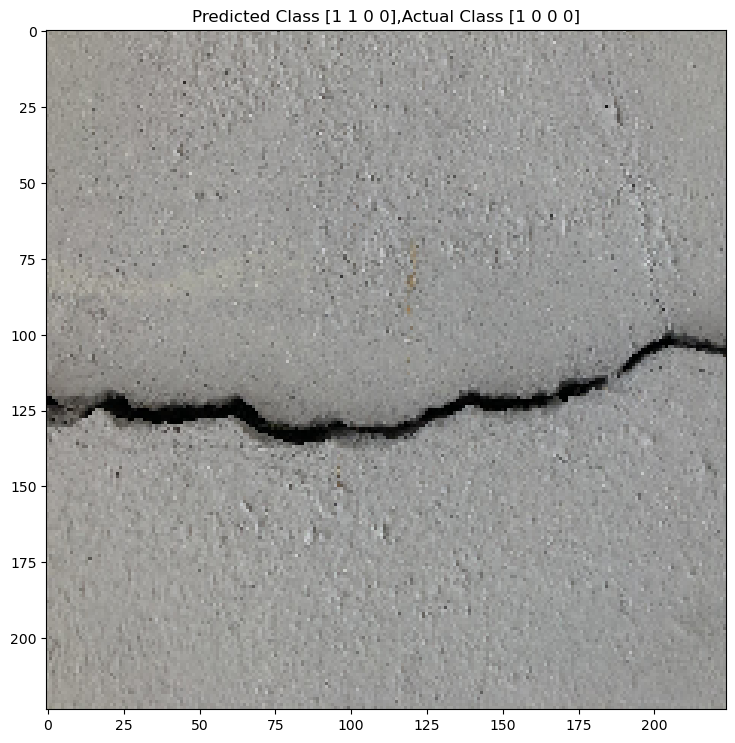

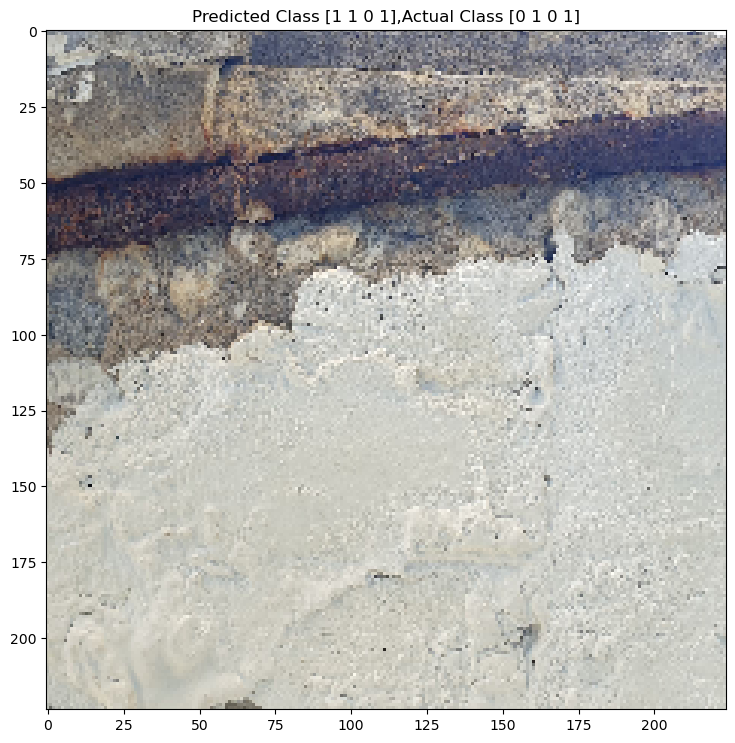

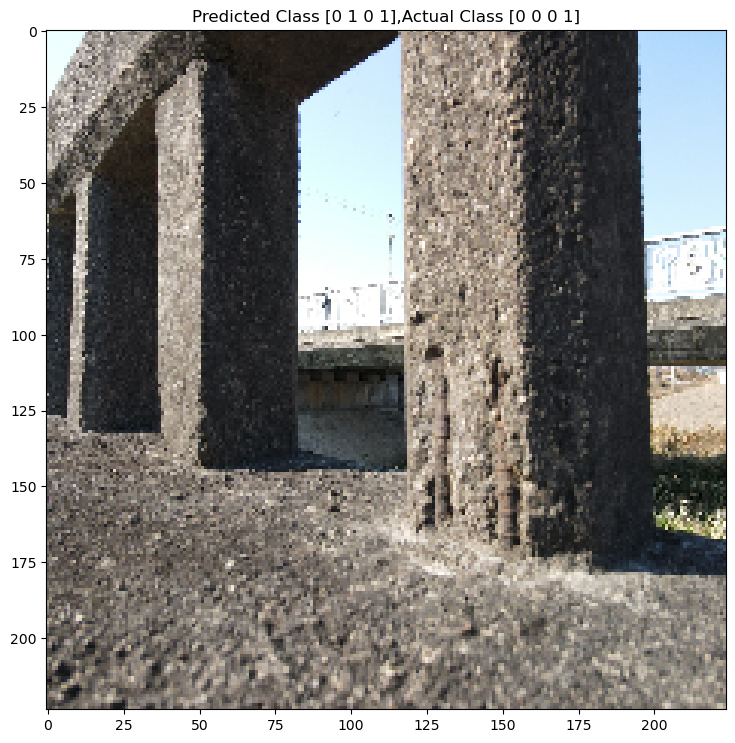

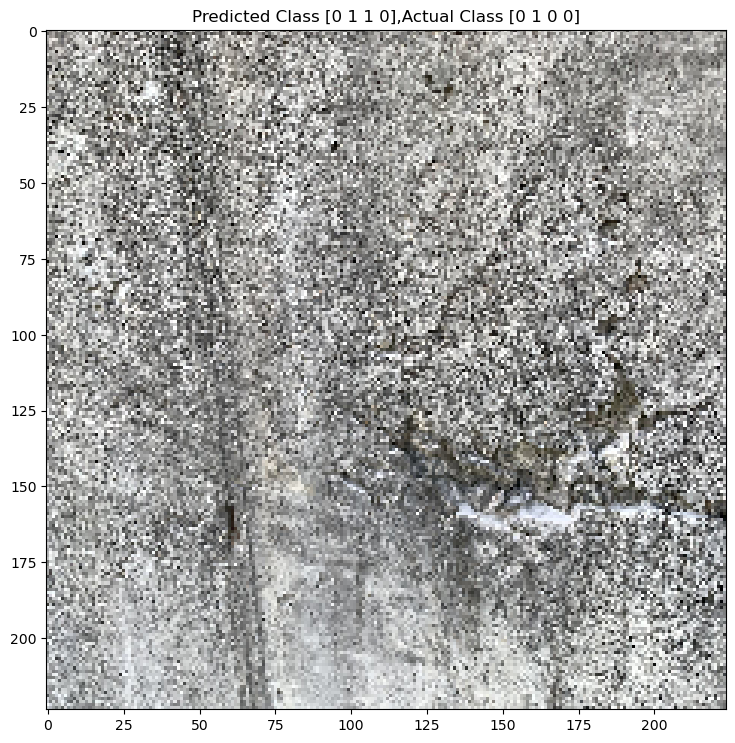

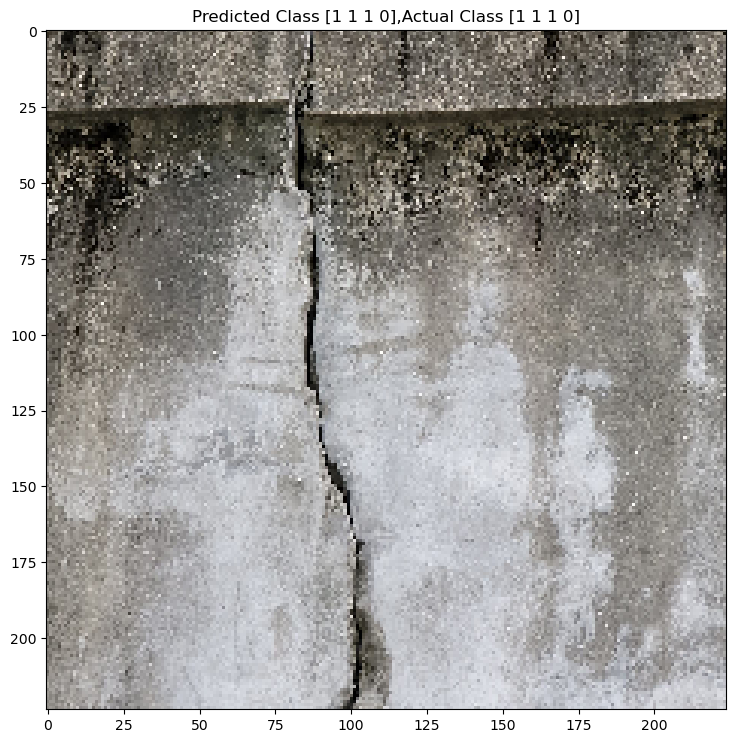

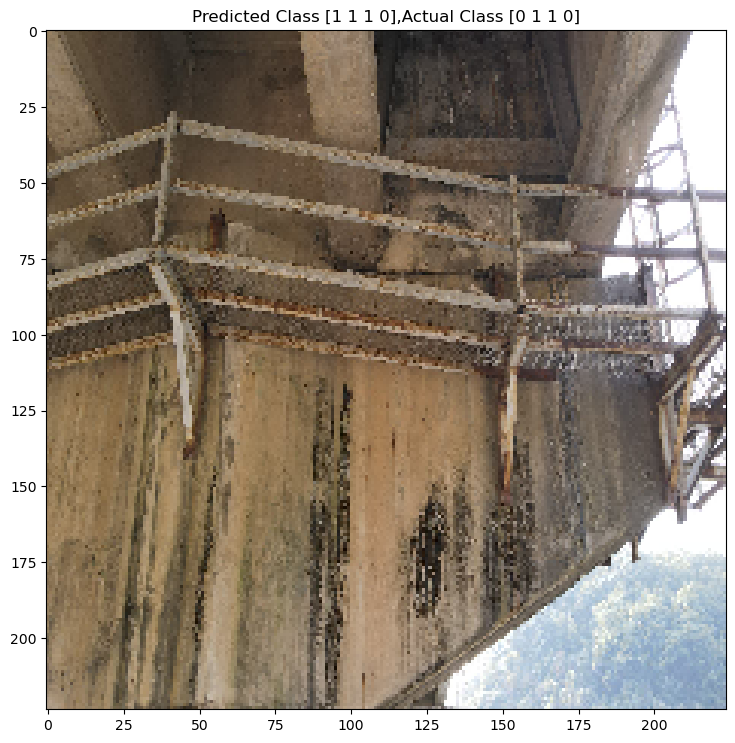

In [66]:
c = 350
for i in range(6):
    plt.figure(figsize=(20,30))
    plt.subplot(3,2, i+1)
    plt.imshow(x_test[c])
    plt.title("Predicted Class {},Actual Class {}".format(y_new_pred[c], y_test[c]))
    c += 1

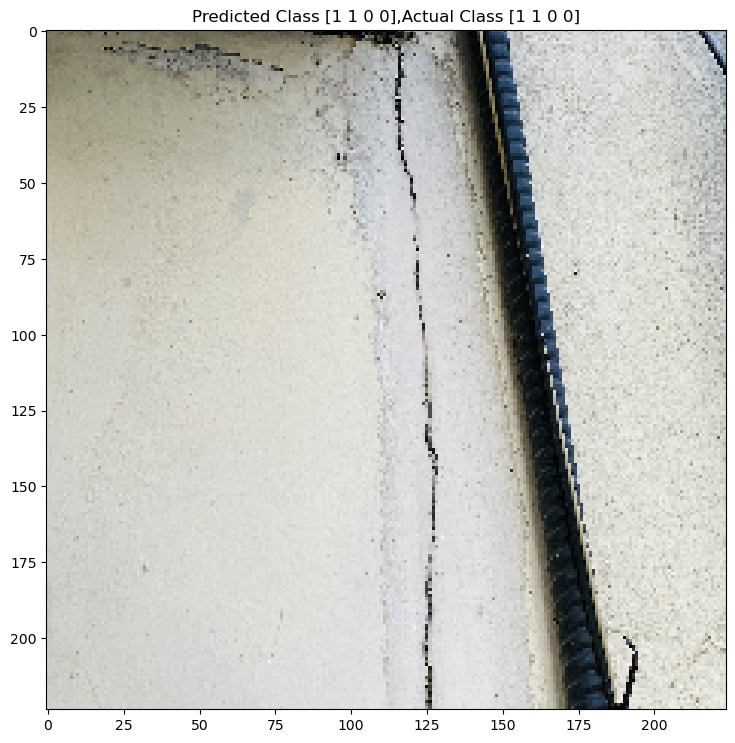

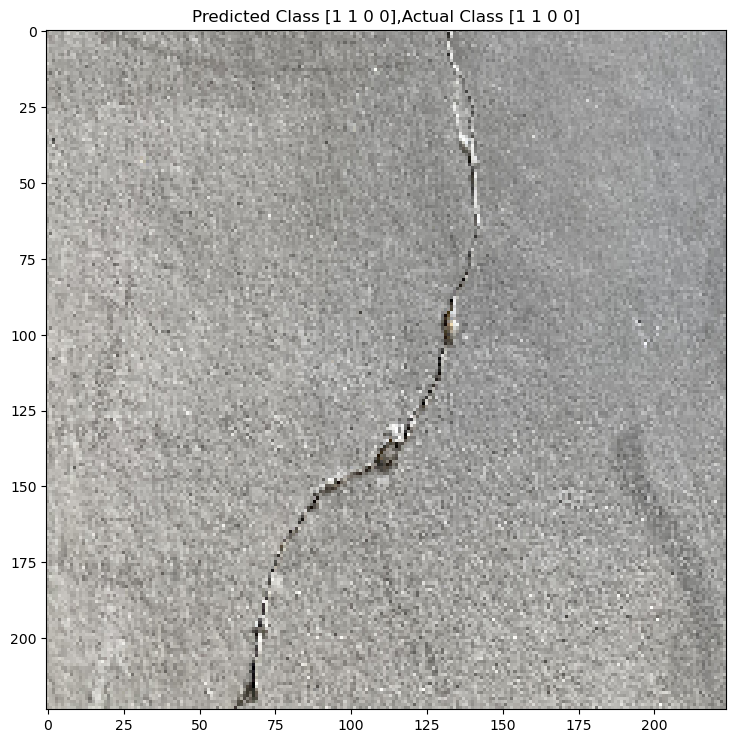

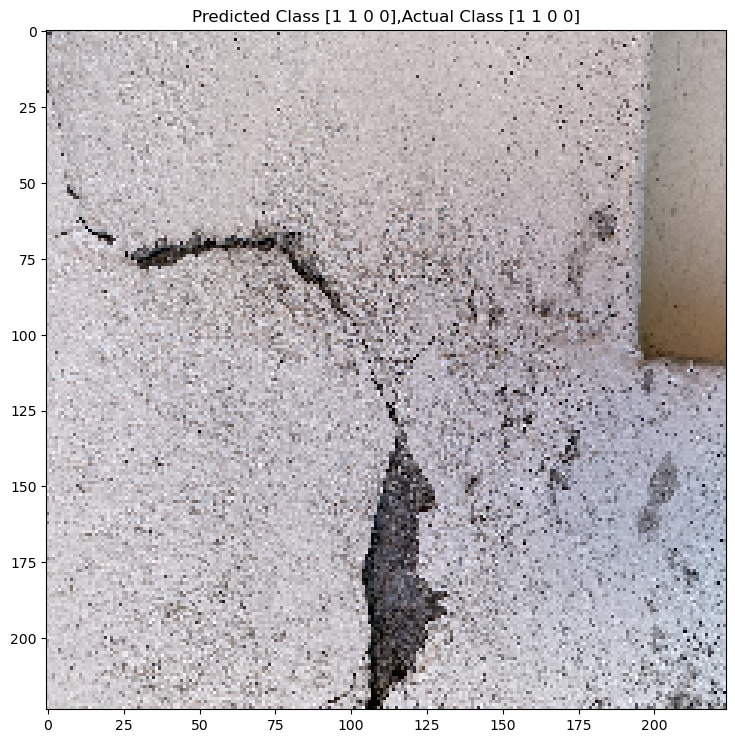

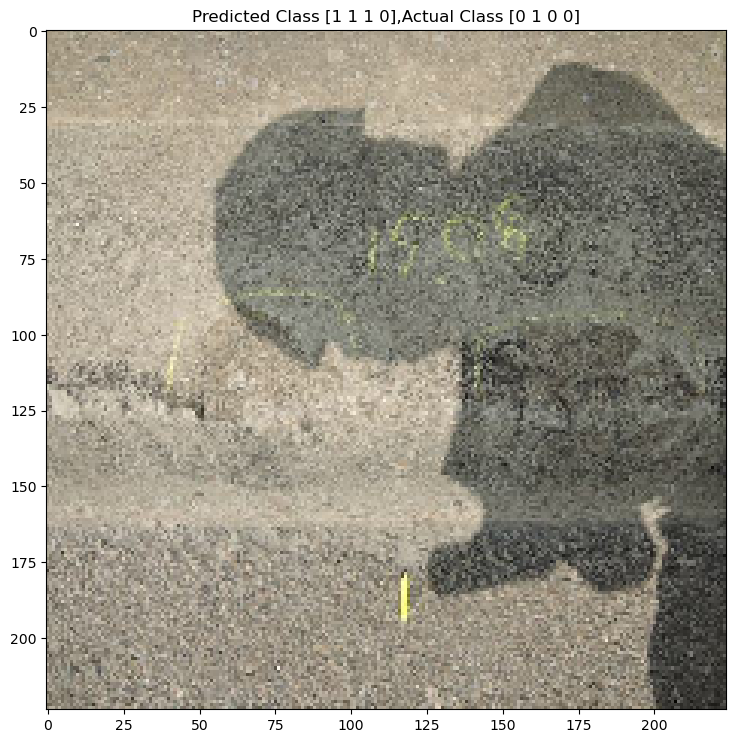

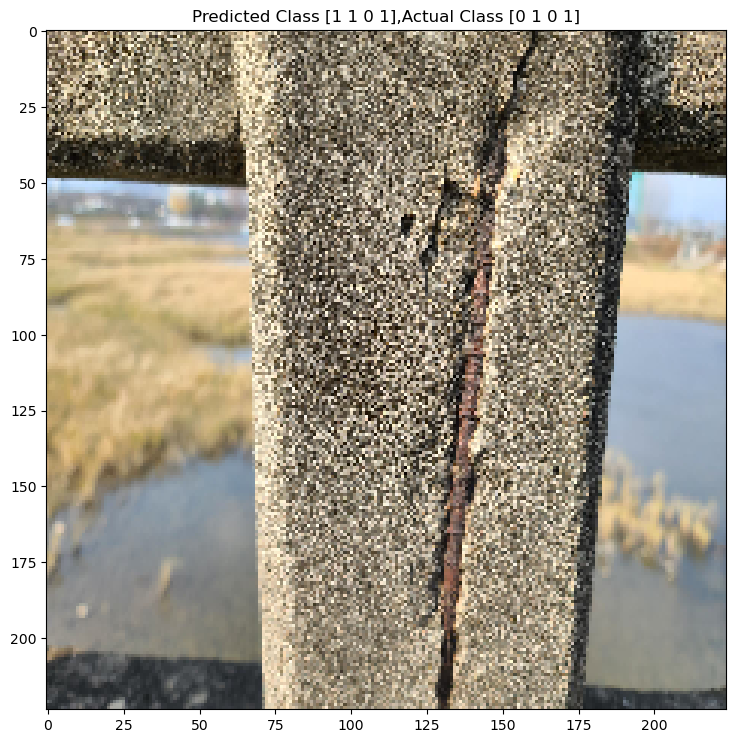

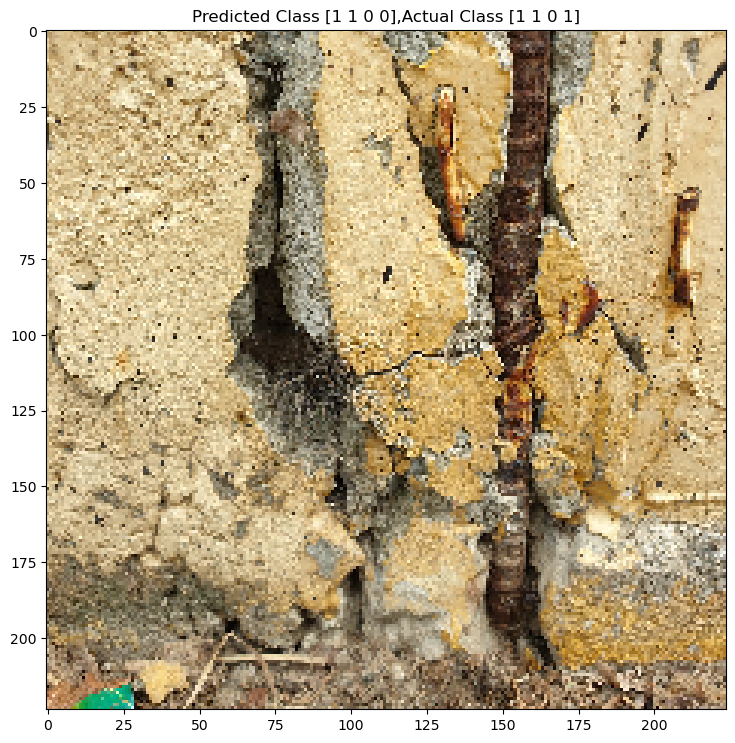

In [56]:
c = 550
for i in range(6):
    plt.figure(figsize=(20,30))
    plt.subplot(3,2, i+1)
    plt.imshow(x_test[c])
    plt.title("Predicted Class {},Actual Class {}".format(y_new_pred[c], y_test[c]))
    c += 1

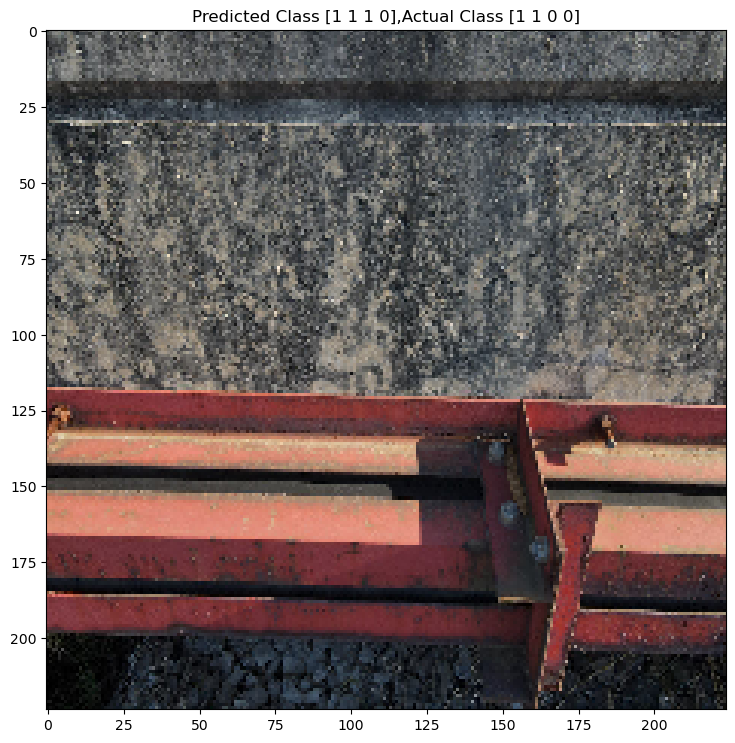

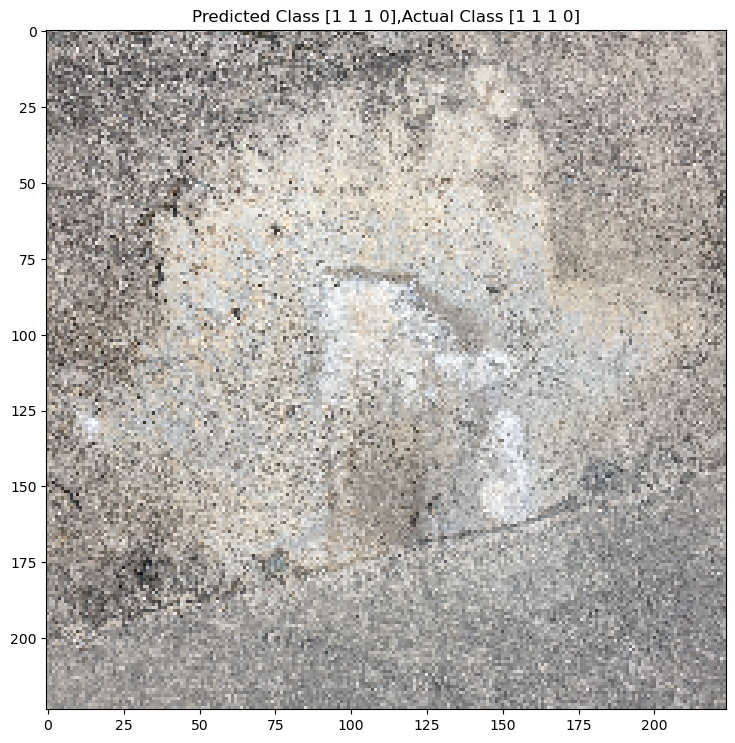

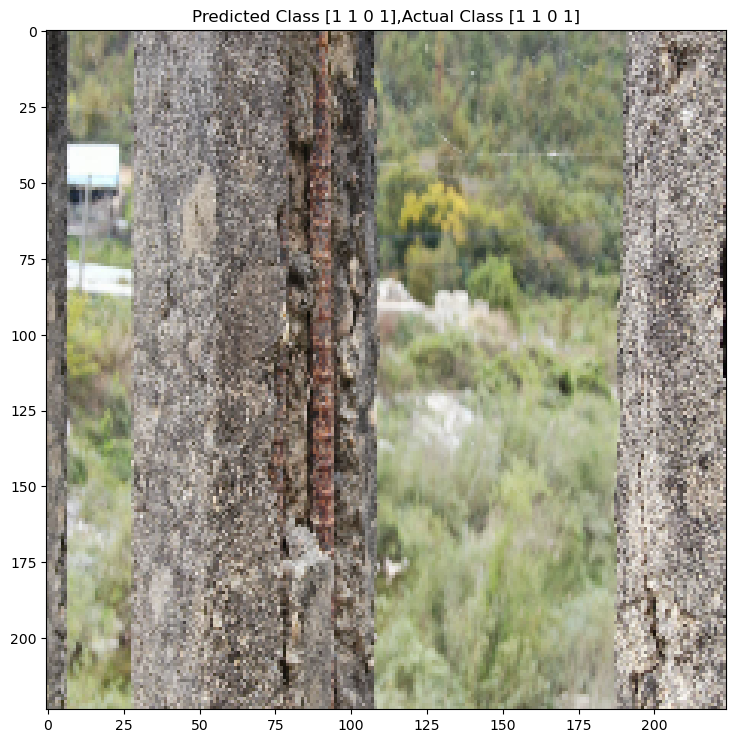

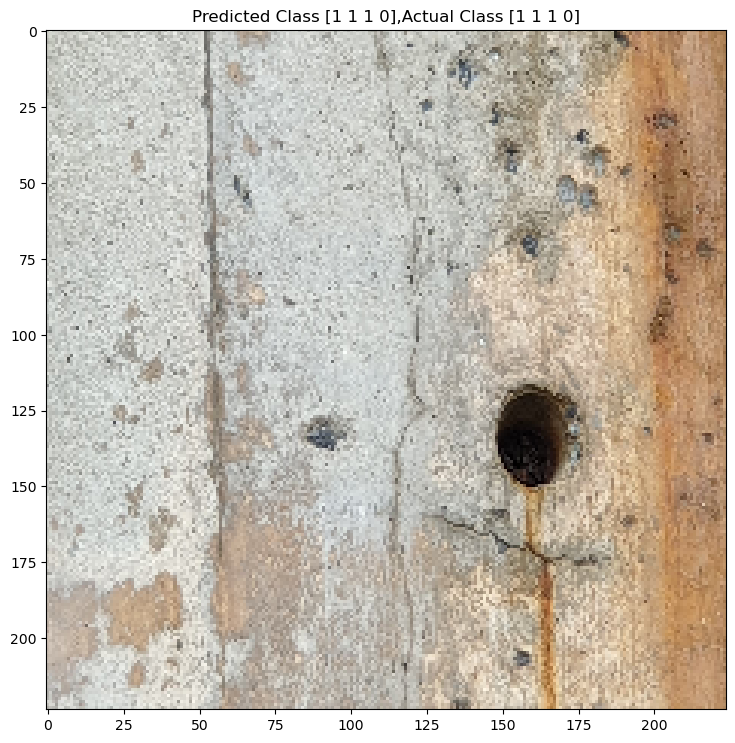

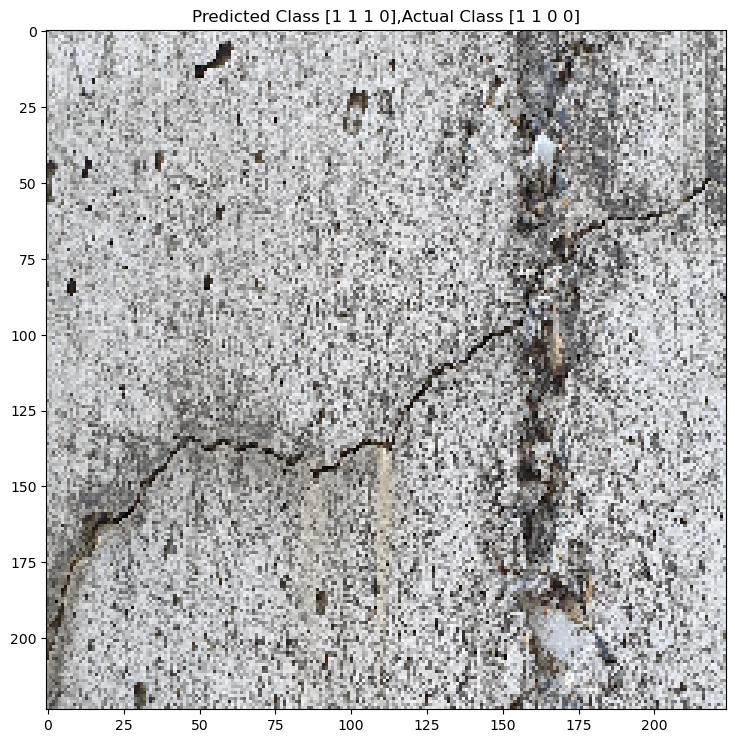

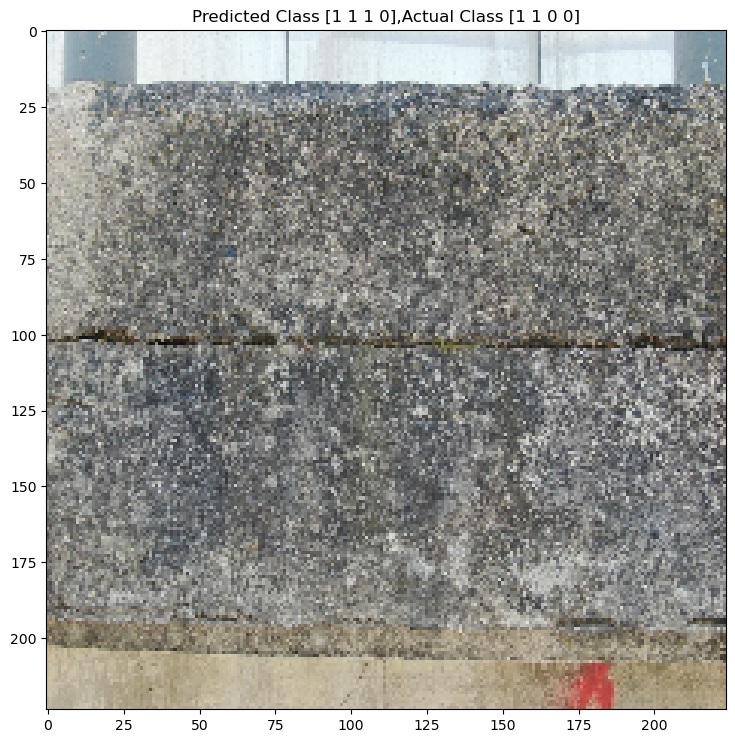

In [55]:
c = 750
for i in range(6):
    plt.figure(figsize=(20,30))
    plt.subplot(3,2, i+1)
    plt.imshow(x_test[c])
    plt.title("Predicted Class {},Actual Class {}".format(y_new_pred[c], y_test[c]))
    c += 1

In [57]:
load_model = tf.keras.models.load_model('DenseNet201_11_29_none.h5') # imagenet

In [58]:
y_pred2 = load_model.predict(x_test)

81/81 [==============================] - 13s 114ms/step


In [59]:
threshold = 0.5
y_new_pred=[]
for sample in  y_pred2:
    y_new_pred.append([1 if i>=0.5 else 0 for i in sample ] )
y_new_pred = np.array(y_new_pred)
y_new_pred

array([[1, 1, 1, 0],
       [1, 1, 0, 0],
       [1, 1, 1, 0],
       ...,
       [1, 1, 1, 0],
       [1, 1, 0, 0],
       [1, 1, 0, 1]])

In [60]:
from sklearn.metrics import classification_report

label_names = ['101', '102', '103', '104']

print(classification_report(y_test, y_new_pred,target_names=label_names,digits=3))

              precision    recall  f1-score   support

         101      0.751     0.972     0.847      1897
         102      0.979     1.000     0.990      2524
         103      0.766     0.714     0.739       870
         104      0.833     0.741     0.784       621

   micro avg      0.852     0.922     0.885      5912
   macro avg      0.832     0.857     0.840      5912
weighted avg      0.859     0.922     0.885      5912
 samples avg      0.859     0.931     0.874      5912



C:\Users\PIAI\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## fdf


In [ ]:
Optimizer = Adam(learning_rate = Learning_rate/10, beta_1=0.9, beta_2=0.999)

In [ ]:
base_model.trainable = True

for layer in base_model.layers[:400]:
    layer.trainable =  False

with tf.device('/device:GPU:0'):
    model.compile(optimizer=Optimizer,loss='binary_crossentropy', metrics=['accuracy'])
    history2 = model.fit(train_datagen, validation_data=val_datagen,epochs=Epochs+20,callbacks=[modelcheckpoint])


In [ ]:
loss = history2.history['loss']
val_loss = history2.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
acc = history2.history['accuracy']
val_acc = history2.history['val_accuracy']
plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
print("Actual \n", y_test)
print("\nPredicted \n",y_pred)

In [ ]:
threshold = 0.5
y_new_pred=[]
for sample in  y_pred:
    y_new_pred.append([1 if i>=0.5 else 0 for i in sample ] )
y_new_pred = np.array(y_new_pred)
y_new_pred

In [ ]:
from sklearn.metrics import classification_report

label_names = ['101', '102', '103', '104']

print(classification_report(y_test, y_new_pred,target_names=label_names,digits=3))